## ResNet

In [44]:
# 필요없는 경고 메시지 무시
import warnings
import tensorflow_datasets as tfds
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
warnings.filterwarnings("ignore")

IMG_SIZE = 160
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:90%]', 'train[90%:95%]', 'train[95%:]'],
    with_info=True,
    as_supervised=True,
)

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

for image_batch, label_batch in train_batches.take(1):
    pass

In [45]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import load_img, img_to_array
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model ResNet50
base_model = ResNet50(input_shape=IMG_SHAPE,weights='imagenet',include_top=False)
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 166, 166, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 80, 80, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 80, 80, 64)   256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [46]:
feature_batch = base_model(image_batch)
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

dense_layer = tf.keras.layers.Dense(2048, activation='relu')
dense_layer2 = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer2(dense_layer(feature_batch_average)))  
print(prediction_batch.shape)

(32, 2048)
(32, 5)


In [47]:
#VGG16 base 모델은 W값 수정 X
base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  dense_layer2,
  prediction_layer
])
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 5, 5, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_3 ( (None, 2048)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 2048)              4196352   
_________________________________________________________________
dense_10 (Dense)             (None, 512)               1049088   
_________________________________________________________________
dense_11 (Dense)             (None, 5)                 2565      
Total params: 28,835,717
Trainable params: 5,248,005
Non-trainable params: 23,587,712
_________________________________________________________________


In [49]:
from tensorflow import keras 
base_learning_rate = 0.0001
model.compile(optimizer=keras.optimizers.Adamax(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])
validation_steps=6
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

6/6 [==============================] - 0s 42ms/step - loss: 1.6875 - accuracy: 0.1639
initial loss: 1.69
initial accuracy: 0.16


In [50]:
EPOCHS = 20   # 15EPOCHS.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
104/104 [==============================] - 8s 74ms/step - loss: 1.4787 - accuracy: 0.3675 - val_loss: 1.5165 - val_accuracy: 0.2951
Epoch 2/20
104/104 [==============================] - 7s 67ms/step - loss: 1.3856 - accuracy: 0.4335 - val_loss: 1.3961 - val_accuracy: 0.3825
Epoch 3/20
104/104 [==============================] - 7s 67ms/step - loss: 1.3334 - accuracy: 0.4511 - val_loss: 1.3450 - val_accuracy: 0.4372
Epoch 4/20
104/104 [==============================] - 7s 68ms/step - loss: 1.2945 - accuracy: 0.4841 - val_loss: 1.2875 - val_accuracy: 0.4699
Epoch 5/20
104/104 [==============================] - 7s 65ms/step - loss: 1.2661 - accuracy: 0.4950 - val_loss: 1.2767 - val_accuracy: 0.4699
Epoch 6/20
104/104 [==============================] - 6s 61ms/step - loss: 1.2325 - accuracy: 0.5177 - val_loss: 1.2378 - val_accuracy: 0.4863
Epoch 7/20
104/104 [==============================] - 6s 59ms/step - loss: 1.2155 - accuracy: 0.5241 - val_loss: 1.2253 - val_accuracy: 0.5137

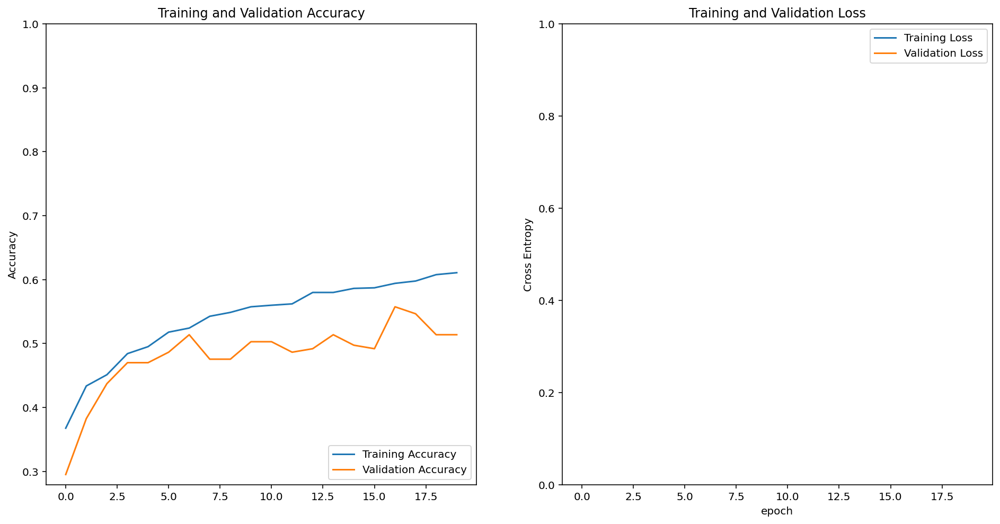

In [51]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## Poor Predict

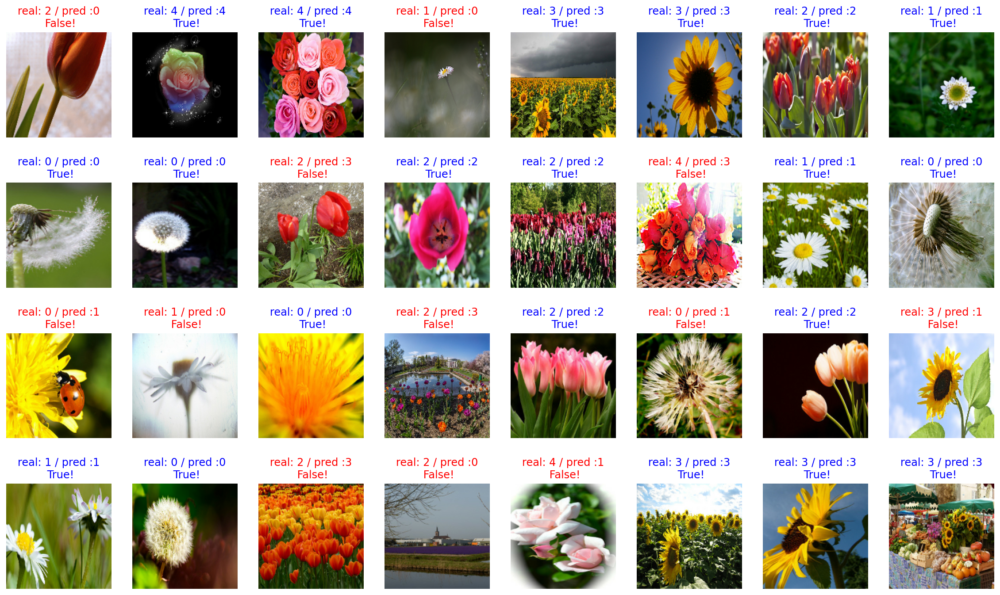

In [52]:
import numpy as np
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass
predictions = np.argmax(predictions, axis=1)
plt.figure(figsize=(20, 12))
for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [53]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print('{}%'.format(count / 32 * 100))

62.5%


In [58]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os
img_dir_path = os.getenv("HOME") + "/project/AIFFEL_Study/e4_image_classifier/flower/images"
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulips_percentage = round(prediction[2] * 100)
    sunflowers_percentage = round(prediction[3] * 100)
    roses_percentage = round(prediction[4] * 100)
    print(f"This image seems {sunflowers_percentage}% sunflowers, and {tulips_percentage}% tulips, and {daisy_percentage}% daisy, and {dandelion_percentage}% dandelion, and {roses_percentage}% roses.")

This image seems 0% sunflowers, and 0% tulips, and 100% daisy, and 0% dandelion, and 0% roses.


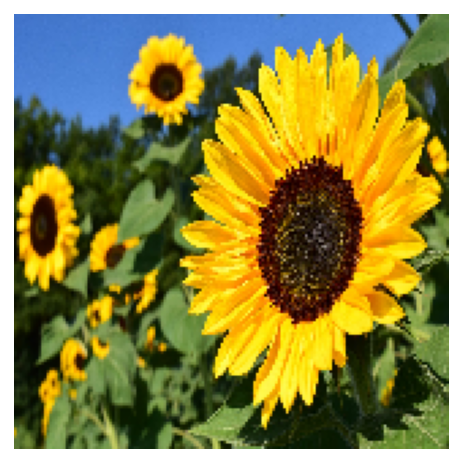

In [59]:
filename = 'sunflower.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% sunflowers, and 0% tulips, and 100% daisy, and 0% dandelion, and 0% roses.


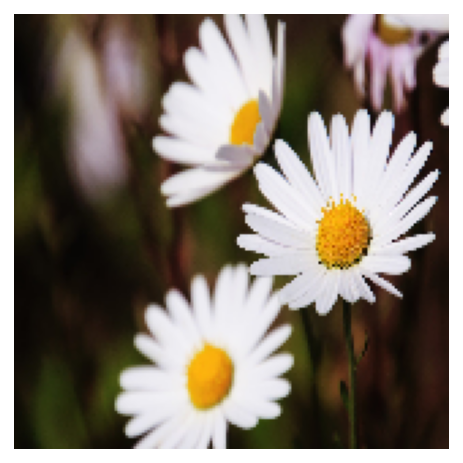

In [60]:
filename = 'daisy.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% sunflowers, and 0% tulips, and 100% daisy, and 0% dandelion, and 0% roses.


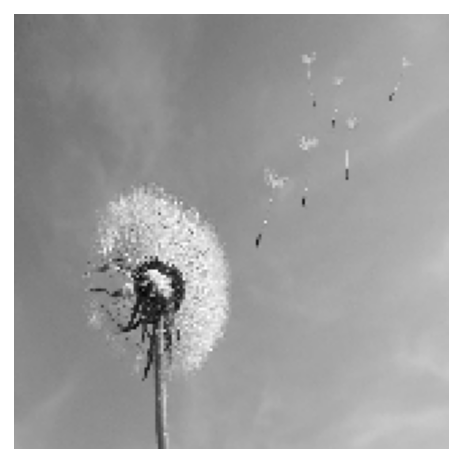

In [64]:
filename = 'tulips.jpg'

show_and_predict_image(img_dir_path, filename)

## InceptionV3

In [65]:
# 필요없는 경고 메시지 무시
import warnings
import tensorflow_datasets as tfds
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
warnings.filterwarnings("ignore")

IMG_SIZE = 160
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:90%]', 'train[90%:95%]', 'train[95%:]'],
    with_info=True,
    as_supervised=True,
)

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

for image_batch, label_batch in train_batches.take(1):
    pass

In [66]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model ResNet50
base_model = tf.keras.applications.InceptionV3(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, 79, 79, 32)   864         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, 79, 79, 32)   96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, 79, 79, 32)   0           batch_normalization_94[0][0]     
_______________________________________________________________________________________

In [67]:
feature_batch = base_model(image_batch)
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

dense_layer = tf.keras.layers.Dense(2048, activation='relu')
dense_layer2 = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer2(dense_layer(feature_batch_average)))  
print(prediction_batch.shape)

(32, 2048)
(32, 5)


In [68]:
#VGG16 base 모델은 W값 수정 X
base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  dense_layer2,
  prediction_layer
])
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 3, 3, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d_4 ( (None, 2048)              0         
_________________________________________________________________
dense_12 (Dense)             (None, 2048)              4196352   
_________________________________________________________________
dense_13 (Dense)             (None, 512)               1049088   
_________________________________________________________________
dense_14 (Dense)             (None, 5)                 2565      
Total params: 27,050,789
Trainable params: 5,248,005
Non-trainable params: 21,802,784
_________________________________________________________________


In [69]:
from tensorflow import keras
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adamax(lr=base_learning_rate),# Set adam optimizer
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])
validation_steps=6
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

6/6 [==============================] - 1s 187ms/step - loss: 2.0601 - accuracy: 0.1803
initial loss: 2.06
initial accuracy: 0.18


In [70]:
EPOCHS = 10

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
104/104 [==============================] - 7s 63ms/step - loss: 0.7595 - accuracy: 0.7206 - val_loss: 0.6008 - val_accuracy: 0.7705
Epoch 2/10
104/104 [==============================] - 5s 52ms/step - loss: 0.4085 - accuracy: 0.8613 - val_loss: 0.6079 - val_accuracy: 0.7760
Epoch 3/10
104/104 [==============================] - 5s 51ms/step - loss: 0.3023 - accuracy: 0.9080 - val_loss: 0.5316 - val_accuracy: 0.8142
Epoch 4/10
104/104 [==============================] - 5s 51ms/step - loss: 0.2300 - accuracy: 0.9379 - val_loss: 0.5063 - val_accuracy: 0.8087
Epoch 5/10
104/104 [==============================] - 5s 52ms/step - loss: 0.1911 - accuracy: 0.9534 - val_loss: 0.4893 - val_accuracy: 0.8361
Epoch 6/10
104/104 [==============================] - 5s 52ms/step - loss: 0.1468 - accuracy: 0.9700 - val_loss: 0.4847 - val_accuracy: 0.8415
Epoch 7/10
104/104 [==============================] - 5s 52ms/step - loss: 0.1196 - accuracy: 0.9815 - val_loss: 0.4796 - val_accuracy: 0.8470

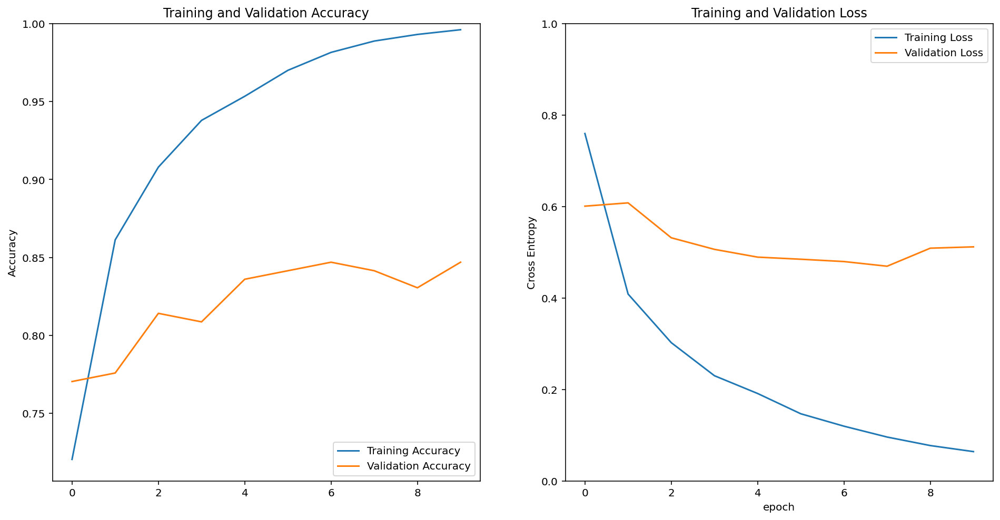

In [71]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

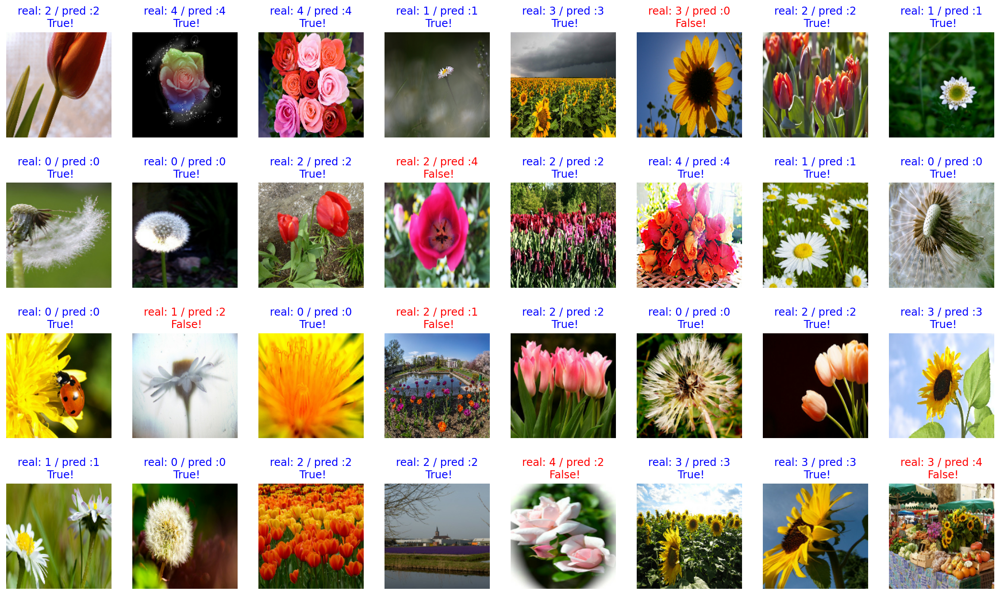

In [72]:
import numpy as np
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass
predictions = np.argmax(predictions, axis=1)
plt.figure(figsize=(20, 12))
for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [73]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print('{}%'.format(count / 32 * 100))

81.25%


In [74]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os
img_dir_path = os.getenv("HOME") + "/project/AIFFEL_Study/e4_image_classifier/flower/images"
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulips_percentage = round(prediction[2] * 100)
    sunflowers_percentage = round(prediction[3] * 100)
    roses_percentage = round(prediction[4] * 100)
    print(f"This image seems {roses_percentage}% roses, and {sunflowers_percentage}% sunflowers, and {tulips_percentage}% tulips, and {daisy_percentage}% daisy, and {dandelion_percentage}% dandelion. ")

This image seems 0% roses, and 0% sunflowers, and 100% tulips, and 0% daisy, and 0% dandelion. 


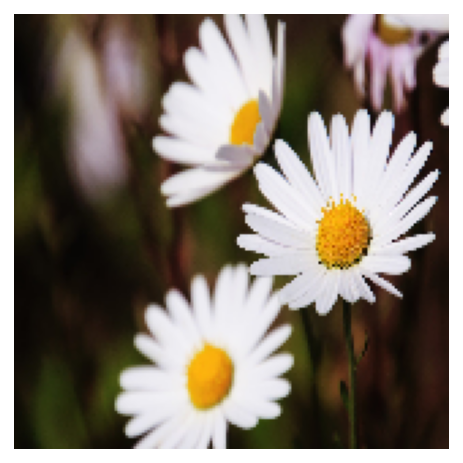

In [75]:
filename = 'daisy.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 14% roses, and 0% sunflowers, and 86% tulips, and 0% daisy, and 0% dandelion. 


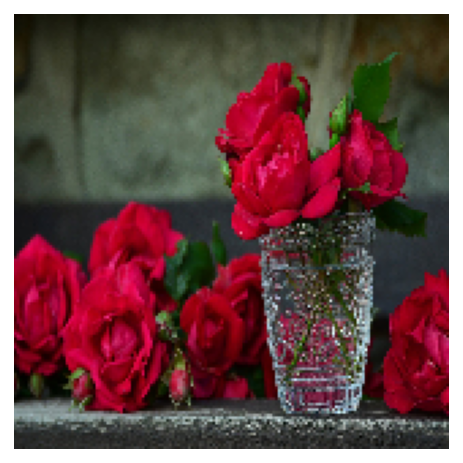

In [76]:
filename = 'roses.jpg'
show_and_predict_image(img_dir_path, filename)


This image seems 91% roses, and 0% sunflowers, and 9% tulips, and 0% daisy, and 0% dandelion. 


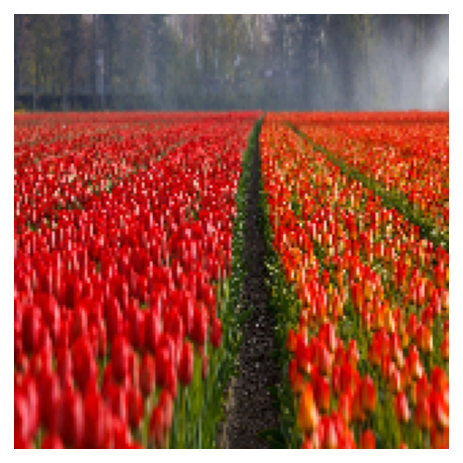

In [77]:
filename = 'tulips.jpg'
show_and_predict_image(img_dir_path, filename)


This image seems 83% roses, and 0% sunflowers, and 17% tulips, and 0% daisy, and 0% dandelion. 


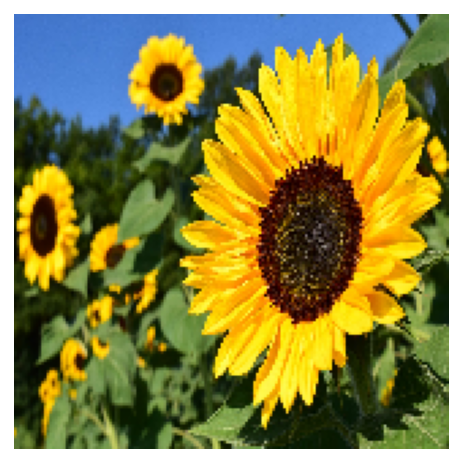

In [80]:
filename = 'sunflower.jpg'
show_and_predict_image(img_dir_path, filename)
